# 🌊 FloodNet: CNN-based Flood Detection from Satellite Imagery

This notebook provides a complete pipeline for training and evaluating a flood detection model using Sentinel-2 satellite imagery.

**Features:**
- 🚀 GPU-accelerated training (auto-detects CUDA)
- 📊 Exploratory Data Analysis
- 🎯 ResNet18-based model with transfer learning
- 📈 Real-time training metrics
- 🔍 Easy visual verification of predictions

---


## 1. Setup & Installation


In [1]:
# Install required packages
%pip install -q rasterio kagglehub tqdm scikit-learn matplotlib seaborn


In [2]:
# Core imports
import os
import json
import glob
import random
import time
from collections import defaultdict

# Data & ML
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision.models import resnet18, ResNet18_Weights

# Geospatial
import rasterio

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import clear_output

# Metrics
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, classification_report, roc_curve, auc
)

# Progress
from tqdm.auto import tqdm

# Set style
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette('husl')

print("✅ All imports successful!")


✅ All imports successful!


In [3]:
# Check GPU availability
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"🖥️  Using device: {device}")

if torch.cuda.is_available():
    print(f"🎮 GPU: {torch.cuda.get_device_name(0)}")
    print(f"💾 GPU Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")
else:
    print("⚠️  No GPU detected. Training will be slower on CPU.")
    print("   Go to Runtime > Change runtime type > GPU")


🖥️  Using device: cuda
🎮 GPU: NVIDIA L4
💾 GPU Memory: 23.80 GB


## 2. Download Dataset from Kaggle


In [4]:
import kagglehub

print("📥 Downloading SEN12FLOOD dataset...")
print("   This may take a few minutes on first run.\n")

# Download dataset (cached after first download)
dataset_path = kagglehub.dataset_download("rhythmroy/sen12flood-flood-detection-dataset")
DATA_DIR = os.path.join(dataset_path, "SEN12FLOOD")

print(f"✅ Dataset ready at: {DATA_DIR}")
print(f"📁 Contents: {os.listdir(DATA_DIR)[:10]}...")


📥 Downloading SEN12FLOOD dataset...
   This may take a few minutes on first run.



100%|██████████| 12.2G/12.2G [09:24<00:00, 23.2MB/s]

Extracting files...


✅ Dataset ready at: /root/.cache/kagglehub/datasets/rhythmroy/sen12flood-flood-detection-dataset/versions/1/SEN12FLOOD
📁 Contents: ['0313', '0163', '0123', '42', '0247', '0117', '0067', '0245', '0214', '55']...


## 3. Exploratory Data Analysis (EDA)


In [5]:
# Explore dataset structure
scene_dirs = sorted([d for d in os.listdir(DATA_DIR) if d.isdigit()])
print(f"📊 Total scenes: {len(scene_dirs)}")

# Check files in a sample scene
sample_scene = os.path.join(DATA_DIR, scene_dirs[0])
sample_files = os.listdir(sample_scene)
print(f"\n📁 Sample scene ({scene_dirs[0]}) files:")
for f in sorted(sample_files)[:15]:
    print(f"   {f}")


📊 Total scenes: 335

📁 Sample scene (0) files:
   S1A_IW_GRDH_1SDV_20190206T030905_20190206T030930_025803_02DEB0_2CC8_corrected_VH.tif
   S1A_IW_GRDH_1SDV_20190206T030905_20190206T030930_025803_02DEB0_2CC8_corrected_VV.tif
   S1A_IW_GRDH_1SDV_20190218T030905_20190218T030930_025978_02E4EB_98B8_corrected_VH.tif
   S1A_IW_GRDH_1SDV_20190218T030905_20190218T030930_025978_02E4EB_98B8_corrected_VV.tif
   S1A_IW_GRDH_1SDV_20190302T030905_20190302T030930_026153_02EB31_1973_corrected_VH.tif
   S1A_IW_GRDH_1SDV_20190302T030905_20190302T030930_026153_02EB31_1973_corrected_VV.tif
   S1A_IW_GRDH_1SDV_20190313T161522_20190313T161557_026321_02F156_A8A9_corrected_VH.tif
   S1A_IW_GRDH_1SDV_20190313T161522_20190313T161557_026321_02F156_A8A9_corrected_VV.tif
   S1A_IW_GRDH_1SDV_20190314T030905_20190314T030930_026328_02F196_2EC3_corrected_VH.tif
   S1A_IW_GRDH_1SDV_20190314T030905_20190314T030930_026328_02F196_2EC3_corrected_VV.tif
   S1A_IW_GRDH_1SDV_20190320T160724_20190320T160753_026423_02F51E_2D7F_co

In [6]:
# Load and analyze S2 metadata
s2_json_path = os.path.join(DATA_DIR, "S2list.json")
with open(s2_json_path, 'r') as f:
    s2_data = json.load(f)

# Count flood vs non-flood samples
flood_count = 0
non_flood_count = 0

for folder_id, content in s2_data.items():
    if not isinstance(content, dict):
        continue
    for key, value in content.items():
        if key.isdigit() and isinstance(value, dict):
            label = value.get('FLOODING')
            if label is True:
                flood_count += 1
            elif label is False:
                non_flood_count += 1

print(f"\n📊 Dataset Distribution:")
print(f"   🌊 Flood samples: {flood_count}")
print(f"   🏜️  Non-flood samples: {non_flood_count}")
print(f"   📈 Total: {flood_count + non_flood_count}")
print(f"   ⚖️  Flood ratio: {flood_count / (flood_count + non_flood_count) * 100:.1f}%")



📊 Dataset Distribution:
   🌊 Flood samples: 1199
   🏜️  Non-flood samples: 1932
   📈 Total: 3131
   ⚖️  Flood ratio: 38.3%


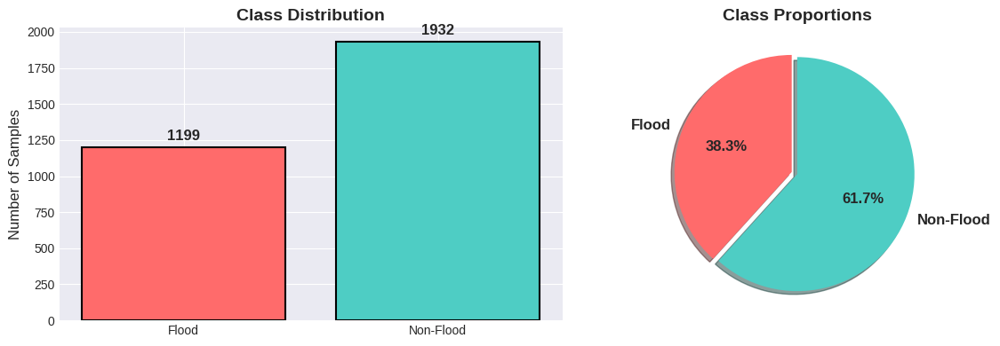

In [7]:
# Visualize class distribution
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Bar chart
labels = ['Flood', 'Non-Flood']
counts = [flood_count, non_flood_count]
colors = ['#ff6b6b', '#4ecdc4']
axes[0].bar(labels, counts, color=colors, edgecolor='black', linewidth=1.5)
axes[0].set_ylabel('Number of Samples', fontsize=12)
axes[0].set_title('Class Distribution', fontsize=14, fontweight='bold')
for i, v in enumerate(counts):
    axes[0].text(i, v + 50, str(v), ha='center', fontsize=12, fontweight='bold')

# Pie chart
axes[1].pie(counts, labels=labels, colors=colors, autopct='%1.1f%%',
            startangle=90, explode=(0.05, 0), shadow=True,
            textprops={'fontsize': 12, 'fontweight': 'bold'})
axes[1].set_title('Class Proportions', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()


/tmp/ipython-input-155956814.py:72: UserWarning: Glyph 127754 (\N{WATER WAVE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/tmp/ipython-input-155956814.py:72: UserWarning: Glyph 127964 (\N{DESERT}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/tmp/ipython-input-155956814.py:72: UserWarning: Glyph 65039 (\N{VARIATION SELECTOR-16}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127754 (\N{WATER WAVE}) missing from font(s) Liberation Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127964 (\N{DESERT}) missing from font(s) Liberation Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 65039 (\N{VARIATION SELECTOR-16}) missing from font(s) Liberation Sans.
  fig.canvas.print_figure(bytes

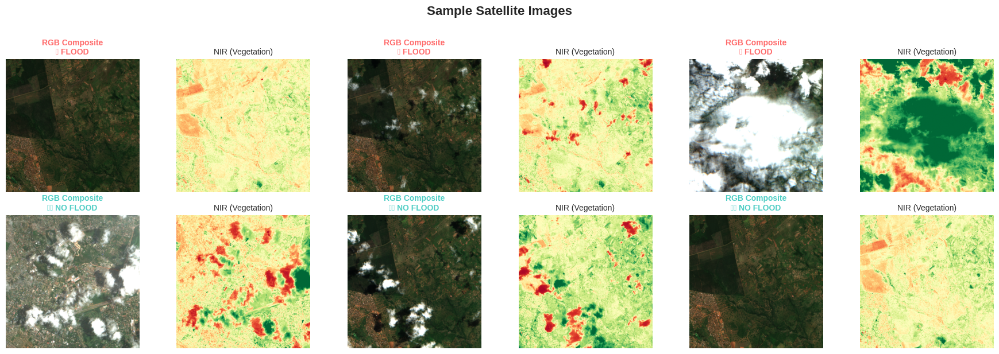

In [8]:
# Visualize sample satellite images
def load_s2_rgb_nir(folder_path, filename_prefix):
    """Load RGB + NIR bands from Sentinel-2 imagery."""
    bands = ["B04", "B03", "B02", "B08"]  # R, G, B, NIR
    images = []

    for b in bands:
        p = os.path.join(folder_path, f"{filename_prefix}_{b}.tif")
        if os.path.exists(p):
            with rasterio.open(p) as src:
                images.append(src.read(1))
        else:
            images.append(np.zeros((256, 256)))

    return np.stack(images, axis=0)

def visualize_sample(folder_path, filename_prefix, label, ax_rgb, ax_nir):
    """Visualize a single sample with RGB and NIR views."""
    data = load_s2_rgb_nir(folder_path, filename_prefix)

    # RGB composite (normalize for display)
    rgb = data[:3].transpose(1, 2, 0)
    rgb = np.clip(rgb / 3000, 0, 1)  # Adjust for S2 reflectance

    # NIR band
    nir = data[3]
    nir = np.clip(nir / 5000, 0, 1)

    label_str = "🌊 FLOOD" if label else "🏜️ NO FLOOD"
    color = '#ff6b6b' if label else '#4ecdc4'

    ax_rgb.imshow(rgb)
    ax_rgb.set_title(f'RGB Composite\n{label_str}', fontsize=10, color=color, fontweight='bold')
    ax_rgb.axis('off')

    ax_nir.imshow(nir, cmap='RdYlGn')
    ax_nir.set_title('NIR (Vegetation)', fontsize=10)
    ax_nir.axis('off')

# Get some flood and non-flood samples
flood_samples = []
non_flood_samples = []

for folder_id, content in s2_data.items():
    if not isinstance(content, dict):
        continue
    for key, value in content.items():
        if key.isdigit() and isinstance(value, dict):
            filename = value.get('filename')
            label = value.get('FLOODING')
            if filename and label is not None:
                folder_path = os.path.join(DATA_DIR, folder_id)
                if label and len(flood_samples) < 3:
                    flood_samples.append((folder_path, filename, label))
                elif not label and len(non_flood_samples) < 3:
                    non_flood_samples.append((folder_path, filename, label))
        if len(flood_samples) >= 3 and len(non_flood_samples) >= 3:
            break
    if len(flood_samples) >= 3 and len(non_flood_samples) >= 3:
        break

# Plot samples
fig, axes = plt.subplots(2, 6, figsize=(18, 6))
fig.suptitle('Sample Satellite Images', fontsize=16, fontweight='bold', y=1.02)

for i, (folder_path, filename, label) in enumerate(flood_samples[:3]):
    visualize_sample(folder_path, filename, label, axes[0, i*2], axes[0, i*2+1])

for i, (folder_path, filename, label) in enumerate(non_flood_samples[:3]):
    visualize_sample(folder_path, filename, label, axes[1, i*2], axes[1, i*2+1])

plt.tight_layout()
plt.show()


## 4. Data Pipeline

Define the dataset class and data augmentation transforms.


In [9]:
# ==================== TRANSFORMS ====================

class Compose:
    """Compose multiple transforms."""
    def __init__(self, transforms):
        self.transforms = transforms

    def __call__(self, sample):
        for t in self.transforms:
            sample = t(sample)
        return sample


class ToTensor:
    """Convert numpy arrays to PyTorch tensors."""
    def __call__(self, sample):
        image, label = sample['image'], sample['label']
        return {
            'image': torch.from_numpy(image).float(),
            'label': torch.from_numpy(label).float()
        }


class RandomFlip:
    """Random horizontal and vertical flips."""
    def __call__(self, sample):
        image, label = sample['image'], sample['label']
        if random.random() > 0.5:
            image = np.flip(image, axis=2).copy()  # Horizontal
        if random.random() > 0.5:
            image = np.flip(image, axis=1).copy()  # Vertical
        return {'image': image, 'label': label}


class RandomRotate:
    """Random 90-degree rotations."""
    def __call__(self, sample):
        image, label = sample['image'], sample['label']
        k = random.randint(0, 3)
        if k > 0:
            image = np.rot90(image, k, axes=(1, 2)).copy()
        return {'image': image, 'label': label}


class RandomBrightness:
    """Random brightness adjustment."""
    def __init__(self, factor_range=(0.8, 1.2)):
        self.factor_range = factor_range

    def __call__(self, sample):
        image, label = sample['image'], sample['label']
        factor = random.uniform(*self.factor_range)
        image = np.clip(image * factor, 0, 1)
        return {'image': image, 'label': label}


print("✅ Transforms defined!")


✅ Transforms defined!


In [11]:
# ==================== DATASET ====================

class SEN12FloodDataset(Dataset):
    """
    SEN12FLOOD Dataset for flood detection.

    Loads Sentinel-2 RGB + NIR bands and binary flood labels.
    """

    def __init__(self, root_dir, transform=None, split='train', seed=42):
        """
        Args:
            root_dir: Path to SEN12FLOOD directory
            transform: Optional transforms
            split: 'train', 'val', or 'test'
            seed: Random seed for reproducible splits
        """
        self.root_dir = root_dir
        self.transform = transform
        self.split = split

        # Load metadata
        s2_json_path = os.path.join(root_dir, "S2list.json")
        with open(s2_json_path, 'r') as f:
            self.s2_data = json.load(f)

        self.samples = []

        # Parse all samples
        for folder_id, content in self.s2_data.items():
            if not isinstance(content, dict):
                continue
            for key, value in content.items():
                if key.isdigit() and isinstance(value, dict):
                    filename = value.get('filename')
                    label = value.get('FLOODING')

                    if filename and label is not None:
                        folder_path = os.path.join(root_dir, folder_id)
                        self.samples.append({
                            'folder_path': folder_path,
                            'folder_id': folder_id,
                            'filename_prefix': filename,
                            'label': 1.0 if label else 0.0
                        })

        # Reproducible shuffle and split
        random.seed(seed)
        random.shuffle(self.samples)

        # 80/10/10 split
        total = len(self.samples)
        train_end = int(0.8 * total)
        val_end = int(0.9 * total)

        if split == 'train':
            self.samples = self.samples[:train_end]
        elif split == 'val':
            self.samples = self.samples[train_end:val_end]
        elif split == 'test':
            self.samples = self.samples[val_end:]

        print(f"📁 Loaded {len(self.samples)} samples for {split} split")

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        sample_info = self.samples[idx]
        folder_path = sample_info['folder_path']
        prefix = sample_info['filename_prefix']
        label = sample_info['label']

        # Load RGB + NIR bands
        bands = ["B04", "B03", "B02", "B08"]  # Red, Green, Blue, NIR
        images = []

        for b in bands:
            p = os.path.join(folder_path, f"{prefix}_{b}.tif")
            if os.path.exists(p):
                with rasterio.open(p) as src:
                    images.append(src.read(1))
            else:
                images.append(np.zeros((256, 256), dtype=np.float32))

        # Stack and normalize
        image = np.stack(images, axis=0).astype(np.float32)
        image = np.clip(image / 10000.0, 0, 1)  # S2 reflectance normalization

        label_np = np.array([label], dtype=np.float32)
        sample = {'image': image, 'label': label_np}

        if self.transform:
            sample = self.transform(sample)

        # Include metadata for visualization
        sample['folder_id'] = sample_info['folder_id']
        sample['filename'] = prefix

        return sample


print("✅ Dataset class defined!")


✅ Dataset class defined!


In [12]:
# Create datasets with transforms
train_transform = Compose([
    RandomFlip(),
    RandomRotate(),
    RandomBrightness(),
    ToTensor()
])

val_transform = Compose([ToTensor()])

# Initialize datasets
train_dataset = SEN12FloodDataset(DATA_DIR, transform=train_transform, split='train')
val_dataset = SEN12FloodDataset(DATA_DIR, transform=val_transform, split='val')
test_dataset = SEN12FloodDataset(DATA_DIR, transform=val_transform, split='test')


📁 Loaded 1789 samples for train split
📁 Loaded 224 samples for val split
📁 Loaded 224 samples for test split


In [13]:
# Create data loaders
BATCH_SIZE = 32  # Increase for GPU
NUM_WORKERS = 2  # Colab has limited workers so change it to 0!

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=True if torch.cuda.is_available() else False
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True if torch.cuda.is_available() else False
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True if torch.cuda.is_available() else False
)

print(f"\n📊 DataLoader Summary:")
print(f"   Train: {len(train_loader)} batches of {BATCH_SIZE}")
print(f"   Val:   {len(val_loader)} batches of {BATCH_SIZE}")
print(f"   Test:  {len(test_loader)} batches of {BATCH_SIZE}")



📊 DataLoader Summary:
   Train: 56 batches of 32
   Val:   7 batches of 32
   Test:  7 batches of 32


## 5. Model Architecture

FloodNet: ResNet18-based binary classifier with modified input layer for 4-channel (RGB+NIR) input.


In [14]:
class FloodNet(nn.Module):
    """
    Flood detection CNN based on ResNet18.

    Modified to accept 4 input channels (RGB + NIR) and
    output binary classification (flood / no flood).
    """

    def __init__(self, input_channels=4, num_classes=1, pretrained=True):
        super(FloodNet, self).__init__()

        # Load pretrained ResNet18
        weights = ResNet18_Weights.DEFAULT if pretrained else None
        self.backbone = resnet18(weights=weights)

        # Modify first conv layer for 4 channels
        old_conv1 = self.backbone.conv1
        self.backbone.conv1 = nn.Conv2d(
            input_channels,
            old_conv1.out_channels,
            kernel_size=old_conv1.kernel_size,
            stride=old_conv1.stride,
            padding=old_conv1.padding,
            bias=old_conv1.bias is not None
        )

        # Initialize new channels smartly
        if pretrained:
            with torch.no_grad():
                # Copy RGB weights
                self.backbone.conv1.weight[:, :3, :, :] = old_conv1.weight
                # NIR channel: average of RGB weights
                self.backbone.conv1.weight[:, 3, :, :] = torch.mean(old_conv1.weight, dim=1)

        # Modify final layer for binary classification
        num_ftrs = self.backbone.fc.in_features
        self.backbone.fc = nn.Sequential(
            nn.Dropout(0.3),
            nn.Linear(num_ftrs, num_classes)
        )

    def forward(self, x):
        return self.backbone(x)

    def predict_proba(self, x):
        """Get prediction probabilities."""
        with torch.no_grad():
            logits = self.forward(x)
            return torch.sigmoid(logits)


# Initialize model
model = FloodNet(input_channels=4, num_classes=1, pretrained=True).to(device)

# Model summary
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f"\n🧠 Model: FloodNet (ResNet18 backbone)")
print(f"   Total parameters: {total_params:,}")
print(f"   Trainable parameters: {trainable_params:,}")
print(f"   Input: 4 channels (RGB + NIR)")
print(f"   Output: Binary classification")


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 243MB/s]



🧠 Model: FloodNet (ResNet18 backbone)
   Total parameters: 11,180,161
   Trainable parameters: 11,180,161
   Input: 4 channels (RGB + NIR)
   Output: Binary classification


## 6. Training


In [15]:
# ==================== TRAINING CONFIG ====================

# Hyperparameters
EPOCHS = 15
LEARNING_RATE = 1e-4
WEIGHT_DECAY = 1e-4

# Calculate class weights for imbalanced data
train_labels = [s['label'] for s in train_dataset.samples]
num_pos = sum(train_labels)
num_neg = len(train_labels) - num_pos
pos_weight = torch.tensor([num_neg / max(num_pos, 1.0)]).to(device)

print(f"⚖️  Class weights: pos_weight = {pos_weight.item():.2f}")
print(f"   (Compensating for {num_pos:.0f} positive vs {num_neg:.0f} negative samples)")

# Loss function with class weighting
criterion = nn.BCEWithLogitsLoss(pos_weight=pos_weight)

# Optimizer with weight decay
optimizer = optim.AdamW(model.parameters(), lr=LEARNING_RATE, weight_decay=WEIGHT_DECAY)

# Learning rate scheduler
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS, eta_min=1e-6)


⚖️  Class weights: pos_weight = 3.24
   (Compensating for 422 positive vs 1367 negative samples)


In [16]:
# ==================== TRAINING LOOP ====================

def train_epoch(model, loader, criterion, optimizer, device):
    """Train for one epoch."""
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    pbar = tqdm(loader, desc='Training', leave=False)
    for batch in pbar:
        images = batch['image'].to(device)
        labels = batch['label'].to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        predicted = (torch.sigmoid(outputs) > 0.5).float()
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

        pbar.set_postfix({'loss': f'{loss.item():.4f}', 'acc': f'{correct/total:.4f}'})

    return running_loss / len(loader), correct / total


def validate_epoch(model, loader, criterion, device):
    """Validate for one epoch."""
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for batch in tqdm(loader, desc='Validating', leave=False):
            images = batch['image'].to(device)
            labels = batch['label'].to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item()
            predicted = (torch.sigmoid(outputs) > 0.5).float()
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    return running_loss / len(loader), correct / total


In [17]:
# ==================== TRAIN THE MODEL ====================

# History for plotting
history = {
    'train_loss': [], 'train_acc': [],
    'val_loss': [], 'val_acc': []
}

best_val_acc = 0.0
best_model_state = None

print("\n" + "="*60)
print("🚀 STARTING TRAINING")
print("="*60)

for epoch in range(EPOCHS):
    start_time = time.time()

    # Train
    train_loss, train_acc = train_epoch(model, train_loader, criterion, optimizer, device)

    # Validate
    val_loss, val_acc = validate_epoch(model, val_loader, criterion, device)

    # Update scheduler
    scheduler.step()

    # Save history
    history['train_loss'].append(train_loss)
    history['train_acc'].append(train_acc)
    history['val_loss'].append(val_loss)
    history['val_acc'].append(val_acc)

    # Save best model
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        best_model_state = model.state_dict().copy()
        torch.save(best_model_state, 'floodnet_best.pth')

    # Print progress
    elapsed = time.time() - start_time
    lr = optimizer.param_groups[0]['lr']

    print(f"\nEpoch [{epoch+1}/{EPOCHS}] ({elapsed:.1f}s)")
    print(f"  📉 Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f}")
    print(f"  📊 Val Loss:   {val_loss:.4f} | Val Acc:   {val_acc:.4f}")
    print(f"  📈 LR: {lr:.2e} | Best Val Acc: {best_val_acc:.4f}")

    # Save checkpoint every 5 epochs
    if (epoch + 1) % 5 == 0:
        torch.save(model.state_dict(), f'floodnet_epoch_{epoch+1}.pth')
        print(f"  💾 Checkpoint saved: floodnet_epoch_{epoch+1}.pth")

# Load best model
model.load_state_dict(best_model_state)
torch.save(best_model_state, 'floodnet_final.pth')

print("\n" + "="*60)
print("✅ TRAINING COMPLETE!")
print(f"   Best Validation Accuracy: {best_val_acc:.4f}")
print(f"   Model saved to: floodnet_final.pth")
print("="*60)



🚀 STARTING TRAINING


Training:   0%|          | 0/56 [00:00<?, ?it/s]

Validating:   0%|          | 0/7 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c6fa2b19e40>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1600, in _shutdown_workers
    self._pin_memory_thread.join()
  File "/usr/lib/python3.12/threading.py", line 1146, in join
    raise RuntimeError("cannot join current thread")
RuntimeError: cannot join current thread
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c6fa2b19e40>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/


Epoch [1/15] (22.5s)
  📉 Train Loss: 0.7552 | Train Acc: 0.7060
  📊 Val Loss:   0.6360 | Val Acc:   0.7768
  📈 LR: 9.89e-05 | Best Val Acc: 0.7768


Training:   0%|          | 0/56 [00:00<?, ?it/s]

Validating:   0%|          | 0/7 [00:00<?, ?it/s]


Epoch [2/15] (20.1s)
  📉 Train Loss: 0.5667 | Train Acc: 0.7932
  📊 Val Loss:   0.5240 | Val Acc:   0.8705
  📈 LR: 9.57e-05 | Best Val Acc: 0.8705


Training:   0%|          | 0/56 [00:00<?, ?it/s]

Validating:   0%|          | 0/7 [00:00<?, ?it/s]


Epoch [3/15] (19.6s)
  📉 Train Loss: 0.5104 | Train Acc: 0.8211
  📊 Val Loss:   0.5270 | Val Acc:   0.8482
  📈 LR: 9.05e-05 | Best Val Acc: 0.8705


Training:   0%|          | 0/56 [00:00<?, ?it/s]

Validating:   0%|          | 0/7 [00:00<?, ?it/s]


Epoch [4/15] (20.1s)
  📉 Train Loss: 0.4202 | Train Acc: 0.8413
  📊 Val Loss:   0.5883 | Val Acc:   0.7946
  📈 LR: 8.36e-05 | Best Val Acc: 0.8705


Training:   0%|          | 0/56 [00:00<?, ?it/s]

Validating:   0%|          | 0/7 [00:00<?, ?it/s]


Epoch [5/15] (20.2s)
  📉 Train Loss: 0.3992 | Train Acc: 0.8614
  📊 Val Loss:   0.4828 | Val Acc:   0.8214
  📈 LR: 7.52e-05 | Best Val Acc: 0.8705
  💾 Checkpoint saved: floodnet_epoch_5.pth


Training:   0%|          | 0/56 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c6fa2b19e40>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
      Exception ignored in:  <function _MultiProcessingDataLoaderIter.__del__ at 0x7c6fa2b19e40> 
 Traceback (most recent call last):
   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
 ^    ^self._shutdown_workers()^
^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
^    ^if w.is_alive():^
^ ^ ^ ^ ^ ^ ^ ^^^^^^^^^^^

Validating:   0%|          | 0/7 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c6fa2b19e40>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c6fa2b19e40>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16


Epoch [6/15] (21.6s)
  📉 Train Loss: 0.3501 | Train Acc: 0.8664
  📊 Val Loss:   0.4112 | Val Acc:   0.8527
  📈 LR: 6.58e-05 | Best Val Acc: 0.8705


Training:   0%|          | 0/56 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c6fa2b19e40>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c6fa2b19e40>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Validating:   0%|          | 0/7 [00:00<?, ?it/s]


Epoch [7/15] (22.5s)
  📉 Train Loss: 0.3367 | Train Acc: 0.8636
  📊 Val Loss:   0.4343 | Val Acc:   0.8571
  📈 LR: 5.57e-05 | Best Val Acc: 0.8705


Training:   0%|          | 0/56 [00:00<?, ?it/s]

Validating:   0%|          | 0/7 [00:00<?, ?it/s]


Epoch [8/15] (20.5s)
  📉 Train Loss: 0.2756 | Train Acc: 0.8916
  📊 Val Loss:   0.3517 | Val Acc:   0.8705
  📈 LR: 4.53e-05 | Best Val Acc: 0.8705


Training:   0%|          | 0/56 [00:00<?, ?it/s]

Validating:   0%|          | 0/7 [00:00<?, ?it/s]


Epoch [9/15] (20.0s)
  📉 Train Loss: 0.2770 | Train Acc: 0.8849
  📊 Val Loss:   0.4192 | Val Acc:   0.8616
  📈 LR: 3.52e-05 | Best Val Acc: 0.8705


Training:   0%|          | 0/56 [00:00<?, ?it/s]

Validating:   0%|          | 0/7 [00:00<?, ?it/s]


Epoch [10/15] (20.3s)
  📉 Train Loss: 0.2488 | Train Acc: 0.8932
  📊 Val Loss:   0.3152 | Val Acc:   0.8884
  📈 LR: 2.58e-05 | Best Val Acc: 0.8884
  💾 Checkpoint saved: floodnet_epoch_10.pth


Training:   0%|          | 0/56 [00:00<?, ?it/s]

Validating:   0%|          | 0/7 [00:00<?, ?it/s]


Epoch [11/15] (19.6s)
  📉 Train Loss: 0.2330 | Train Acc: 0.9027
  📊 Val Loss:   0.2984 | Val Acc:   0.8839
  📈 LR: 1.74e-05 | Best Val Acc: 0.8884


Training:   0%|          | 0/56 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c6fa2b19e40>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c6fa2b19e40>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Validating:   0%|          | 0/7 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c6fa2b19e40>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c6fa2b19e40>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16


Epoch [12/15] (23.0s)
  📉 Train Loss: 0.2126 | Train Acc: 0.9055
  📊 Val Loss:   0.2967 | Val Acc:   0.9062
  📈 LR: 1.05e-05 | Best Val Acc: 0.9062


Training:   0%|          | 0/56 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c6fa2b19e40>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c6fa2b19e40>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Validating:   0%|          | 0/7 [00:00<?, ?it/s]


Epoch [13/15] (23.2s)
  📉 Train Loss: 0.1859 | Train Acc: 0.9167
  📊 Val Loss:   0.2905 | Val Acc:   0.9018
  📈 LR: 5.28e-06 | Best Val Acc: 0.9062


Training:   0%|          | 0/56 [00:00<?, ?it/s]

Validating:   0%|          | 0/7 [00:00<?, ?it/s]


Epoch [14/15] (21.0s)
  📉 Train Loss: 0.2042 | Train Acc: 0.9167
  📊 Val Loss:   0.3004 | Val Acc:   0.8929
  📈 LR: 2.08e-06 | Best Val Acc: 0.9062


Training:   0%|          | 0/56 [00:00<?, ?it/s]

Validating:   0%|          | 0/7 [00:00<?, ?it/s]


Epoch [15/15] (20.9s)
  📉 Train Loss: 0.2093 | Train Acc: 0.9078
  📊 Val Loss:   0.2936 | Val Acc:   0.9018
  📈 LR: 1.00e-06 | Best Val Acc: 0.9062
  💾 Checkpoint saved: floodnet_epoch_15.pth

✅ TRAINING COMPLETE!
   Best Validation Accuracy: 0.9062
   Model saved to: floodnet_final.pth


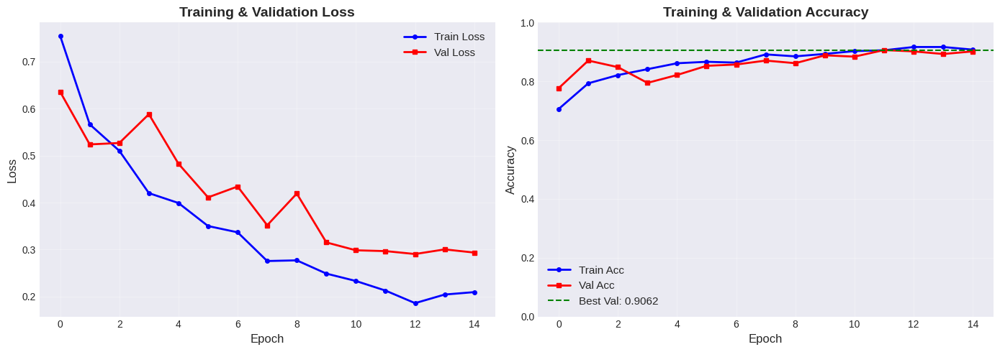

In [18]:
# ==================== PLOT TRAINING HISTORY ====================

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Loss plot
axes[0].plot(history['train_loss'], 'b-', linewidth=2, label='Train Loss', marker='o', markersize=4)
axes[0].plot(history['val_loss'], 'r-', linewidth=2, label='Val Loss', marker='s', markersize=4)
axes[0].set_xlabel('Epoch', fontsize=12)
axes[0].set_ylabel('Loss', fontsize=12)
axes[0].set_title('Training & Validation Loss', fontsize=14, fontweight='bold')
axes[0].legend(fontsize=11)
axes[0].grid(True, alpha=0.3)

# Accuracy plot
axes[1].plot(history['train_acc'], 'b-', linewidth=2, label='Train Acc', marker='o', markersize=4)
axes[1].plot(history['val_acc'], 'r-', linewidth=2, label='Val Acc', marker='s', markersize=4)
axes[1].axhline(y=best_val_acc, color='g', linestyle='--', label=f'Best Val: {best_val_acc:.4f}')
axes[1].set_xlabel('Epoch', fontsize=12)
axes[1].set_ylabel('Accuracy', fontsize=12)
axes[1].set_title('Training & Validation Accuracy', fontsize=14, fontweight='bold')
axes[1].legend(fontsize=11)
axes[1].grid(True, alpha=0.3)
axes[1].set_ylim([0, 1])

plt.tight_layout()
plt.savefig('training_history.png', dpi=150, bbox_inches='tight')
plt.show()


## 7. Evaluation

Comprehensive evaluation on the test set with multiple metrics.


In [19]:
# ==================== EVALUATE ON TEST SET ====================

model.eval()

all_preds = []
all_probs = []
all_targets = []
all_metadata = []

print("🔍 Evaluating on test set...")

with torch.no_grad():
    for batch in tqdm(test_loader, desc='Testing'):
        images = batch['image'].to(device)
        labels = batch['label']

        outputs = model(images)
        probs = torch.sigmoid(outputs)
        preds = (probs > 0.5).float()

        all_preds.append(preds.cpu().numpy().flatten())
        all_probs.append(probs.cpu().numpy().flatten())
        all_targets.append(labels.numpy().flatten())

        # Store metadata for visualization
        for i in range(len(batch['folder_id'])):
            all_metadata.append({
                'folder_id': batch['folder_id'][i],
                'filename': batch['filename'][i]
            })

# Concatenate all batches
all_preds = np.concatenate(all_preds)
all_probs = np.concatenate(all_probs)
all_targets = np.concatenate(all_targets)


🔍 Evaluating on test set...


Testing:   0%|          | 0/7 [00:00<?, ?it/s]

In [20]:
# ==================== COMPUTE METRICS ====================

acc = accuracy_score(all_targets, all_preds)
prec = precision_score(all_targets, all_preds, zero_division=0)
rec = recall_score(all_targets, all_preds, zero_division=0)
f1 = f1_score(all_targets, all_preds, zero_division=0)

print("\n" + "="*50)
print("📊 TEST SET RESULTS")
print("="*50)
print(f"\n   Accuracy:  {acc:.4f}  ({acc*100:.2f}%)")
print(f"   Precision: {prec:.4f}")
print(f"   Recall:    {rec:.4f}")
print(f"   F1 Score:  {f1:.4f}")
print("\n" + "="*50)

# Detailed classification report
print("\n📋 Classification Report:")
print(classification_report(all_targets, all_preds,
                          target_names=['No Flood', 'Flood'],
                          digits=4))



📊 TEST SET RESULTS

   Accuracy:  0.9152  (91.52%)
   Precision: 0.7727
   Recall:    0.9273
   F1 Score:  0.8430


📋 Classification Report:
              precision    recall  f1-score   support

    No Flood     0.9747    0.9112    0.9419       169
       Flood     0.7727    0.9273    0.8430        55

    accuracy                         0.9152       224
   macro avg     0.8737    0.9193    0.8924       224
weighted avg     0.9251    0.9152    0.9176       224



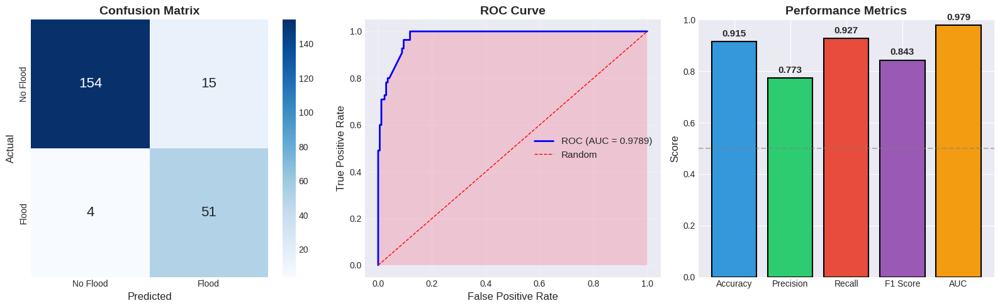

In [21]:
# ==================== VISUALIZE METRICS ====================

fig, axes = plt.subplots(1, 3, figsize=(16, 5))

# 1. Confusion Matrix
cm = confusion_matrix(all_targets, all_preds)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[0],
            xticklabels=['No Flood', 'Flood'],
            yticklabels=['No Flood', 'Flood'],
            annot_kws={'size': 16})
axes[0].set_xlabel('Predicted', fontsize=12)
axes[0].set_ylabel('Actual', fontsize=12)
axes[0].set_title('Confusion Matrix', fontsize=14, fontweight='bold')

# 2. ROC Curve
fpr, tpr, thresholds = roc_curve(all_targets, all_probs)
roc_auc = auc(fpr, tpr)

axes[1].plot(fpr, tpr, 'b-', linewidth=2, label=f'ROC (AUC = {roc_auc:.4f})')
axes[1].plot([0, 1], [0, 1], 'r--', linewidth=1, label='Random')
axes[1].fill_between(fpr, tpr, alpha=0.3)
axes[1].set_xlabel('False Positive Rate', fontsize=12)
axes[1].set_ylabel('True Positive Rate', fontsize=12)
axes[1].set_title('ROC Curve', fontsize=14, fontweight='bold')
axes[1].legend(fontsize=11)
axes[1].grid(True, alpha=0.3)

# 3. Metrics Bar Chart
metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'AUC']
values = [acc, prec, rec, f1, roc_auc]
colors = ['#3498db', '#2ecc71', '#e74c3c', '#9b59b6', '#f39c12']

bars = axes[2].bar(metrics, values, color=colors, edgecolor='black', linewidth=1.5)
axes[2].set_ylim([0, 1])
axes[2].set_ylabel('Score', fontsize=12)
axes[2].set_title('Performance Metrics', fontsize=14, fontweight='bold')
axes[2].axhline(y=0.5, color='gray', linestyle='--', alpha=0.5)

# Add value labels
for bar, val in zip(bars, values):
    axes[2].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.02,
                f'{val:.3f}', ha='center', fontsize=11, fontweight='bold')

plt.tight_layout()
plt.savefig('evaluation_results.png', dpi=150, bbox_inches='tight')
plt.show()


## 8. 🔍 Visual Verification Tool

**Easily visualize and verify the model's flood detection predictions!**

This section provides interactive tools to:
- View predictions on random samples
- Examine misclassified samples
- Compare flood vs non-flood predictions
- Visualize prediction confidence


In [22]:
# ==================== VISUALIZATION HELPERS ====================

def load_and_visualize_sample(folder_id, filename, true_label, pred_label, confidence):
    """
    Load and visualize a single sample with prediction overlay.
    """
    folder_path = os.path.join(DATA_DIR, folder_id)

    # Load bands
    bands = ["B04", "B03", "B02", "B08"]
    images = []

    for b in bands:
        p = os.path.join(folder_path, f"{filename}_{b}.tif")
        if os.path.exists(p):
            with rasterio.open(p) as src:
                images.append(src.read(1))
        else:
            images.append(np.zeros((256, 256)))

    data = np.stack(images, axis=0)

    # Prepare visualizations
    rgb = data[:3].transpose(1, 2, 0)
    rgb = np.clip(rgb / 3000, 0, 1)

    nir = data[3]
    nir = np.clip(nir / 5000, 0, 1)

    # NDWI (Normalized Difference Water Index) - helps highlight water
    green = data[1].astype(float)
    nir_band = data[3].astype(float)
    ndwi = np.where((green + nir_band) != 0,
                    (green - nir_band) / (green + nir_band + 1e-8), 0)

    return rgb, nir, ndwi, true_label, pred_label, confidence


def plot_prediction_grid(samples_data, title="Flood Detection Results"):
    """
    Plot a grid of prediction results.
    """
    n_samples = len(samples_data)
    fig, axes = plt.subplots(n_samples, 4, figsize=(16, 4*n_samples))

    if n_samples == 1:
        axes = axes.reshape(1, -1)

    fig.suptitle(title, fontsize=16, fontweight='bold', y=1.02)

    for i, (rgb, nir, ndwi, true_label, pred_label, confidence) in enumerate(samples_data):
        # Determine correctness
        is_correct = (true_label == pred_label)

        # Status info
        true_str = "🌊 FLOOD" if true_label == 1 else "🏜️ NO FLOOD"
        pred_str = "🌊 FLOOD" if pred_label == 1 else "🏜️ NO FLOOD"
        status = "✅ CORRECT" if is_correct else "❌ WRONG"
        status_color = '#2ecc71' if is_correct else '#e74c3c'

        # RGB
        axes[i, 0].imshow(rgb)
        axes[i, 0].set_title(f'RGB Composite\nTrue: {true_str}', fontsize=10)
        axes[i, 0].axis('off')

        # NIR
        axes[i, 1].imshow(nir, cmap='RdYlGn')
        axes[i, 1].set_title('NIR Band\n(Vegetation)', fontsize=10)
        axes[i, 1].axis('off')

        # NDWI (Water Index)
        im = axes[i, 2].imshow(ndwi, cmap='RdBu', vmin=-1, vmax=1)
        axes[i, 2].set_title('NDWI\n(Blue=Water)', fontsize=10)
        axes[i, 2].axis('off')

        # Prediction summary
        axes[i, 3].text(0.5, 0.7, f'Prediction: {pred_str}', fontsize=14,
                       ha='center', va='center', transform=axes[i, 3].transAxes,
                       fontweight='bold')
        axes[i, 3].text(0.5, 0.5, f'Confidence: {confidence*100:.1f}%', fontsize=12,
                       ha='center', va='center', transform=axes[i, 3].transAxes)
        axes[i, 3].text(0.5, 0.3, status, fontsize=14,
                       ha='center', va='center', transform=axes[i, 3].transAxes,
                       fontweight='bold', color=status_color)
        axes[i, 3].axis('off')
        axes[i, 3].set_facecolor('#f5f5f5')

    plt.tight_layout()
    return fig

print("✅ Visualization helpers loaded!")


✅ Visualization helpers loaded!


/tmp/ipython-input-3305450150.py:88: UserWarning: Glyph 127754 (\N{WATER WAVE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/tmp/ipython-input-3305450150.py:88: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/tmp/ipython-input-3305450150.py:88: UserWarning: Glyph 127964 (\N{DESERT}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/tmp/ipython-input-3305450150.py:88: UserWarning: Glyph 65039 (\N{VARIATION SELECTOR-16}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/tmp/ipython-input-3305450150.py:88: UserWarning: Glyph 127922 (\N{GAME DIE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127754 (\N{WATER WAVE}) missing from font(s) Liberation Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 

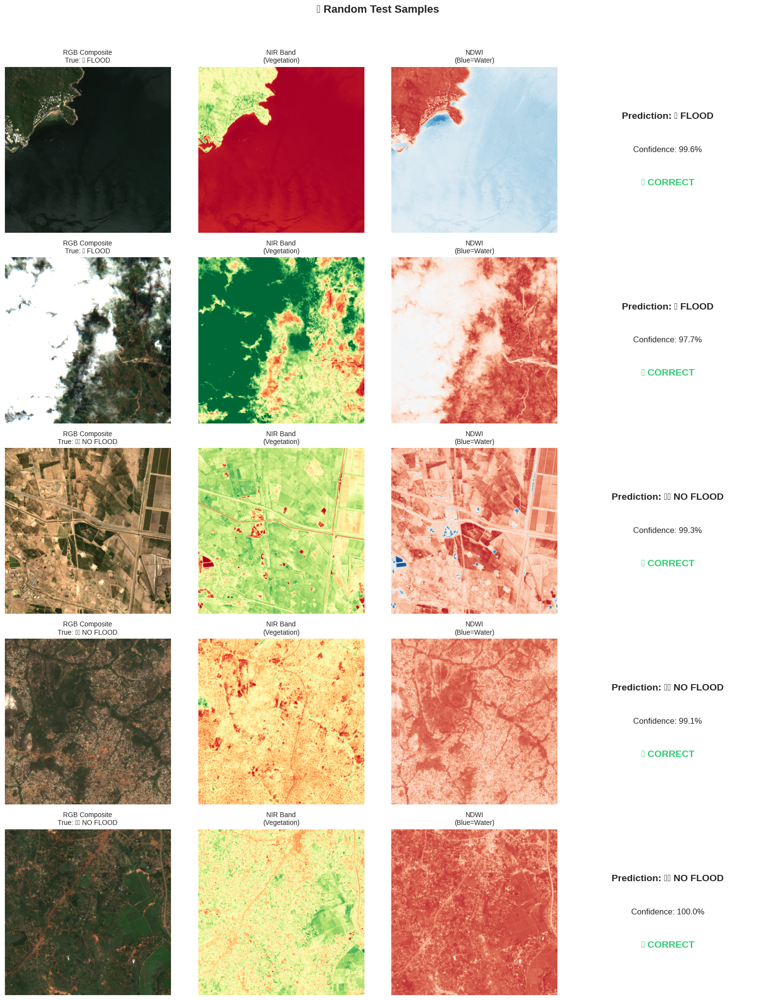

In [23]:
# ==================== VIEW RANDOM PREDICTIONS ====================

def visualize_random_predictions(n_samples=5, seed=None):
    """
    Visualize random predictions from the test set.
    """
    if seed:
        random.seed(seed)

    indices = random.sample(range(len(all_preds)), min(n_samples, len(all_preds)))

    samples_data = []
    for idx in indices:
        meta = all_metadata[idx]
        true_label = all_targets[idx]
        pred_label = all_preds[idx]
        confidence = all_probs[idx] if pred_label == 1 else 1 - all_probs[idx]

        data = load_and_visualize_sample(
            meta['folder_id'], meta['filename'],
            true_label, pred_label, confidence
        )
        samples_data.append(data)

    fig = plot_prediction_grid(samples_data, "🎲 Random Test Samples")
    plt.show()

# Show 5 random predictions
visualize_random_predictions(n_samples=5)


Found 19 misclassified samples


/tmp/ipython-input-3305450150.py:88: UserWarning: Glyph 127964 (\N{DESERT}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/tmp/ipython-input-3305450150.py:88: UserWarning: Glyph 65039 (\N{VARIATION SELECTOR-16}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/tmp/ipython-input-3305450150.py:88: UserWarning: Glyph 127754 (\N{WATER WAVE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/tmp/ipython-input-3305450150.py:88: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) Liberation Sans.
  fig.canvas.print_figure(bytes_io, **kw)


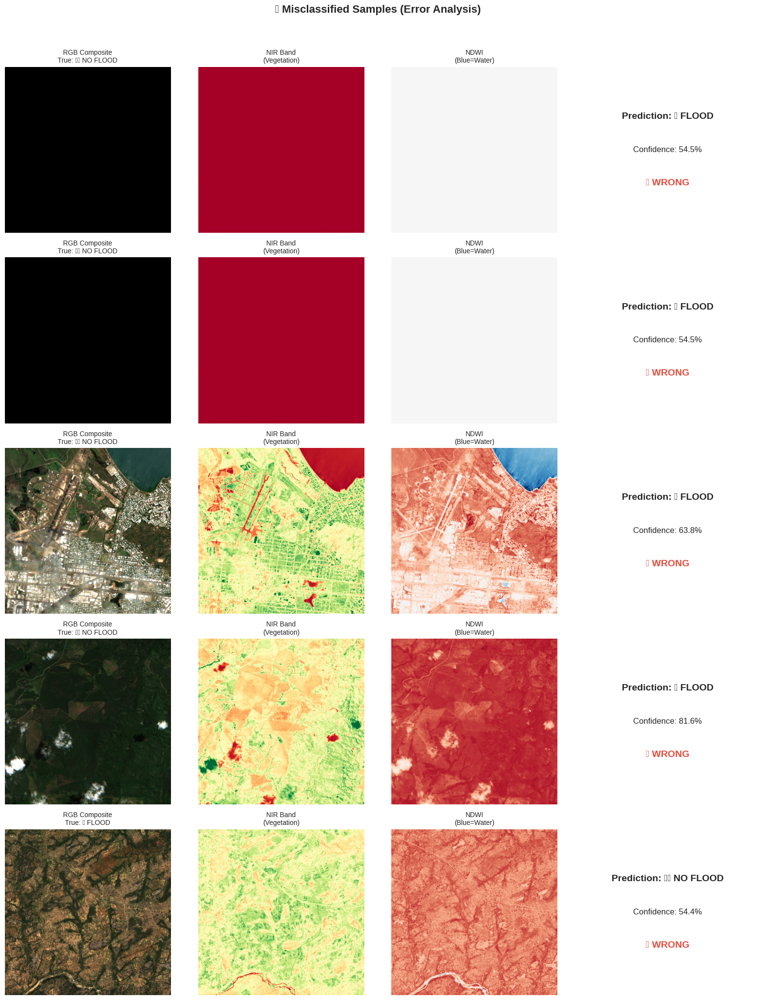

In [24]:
# ==================== VIEW MISCLASSIFIED SAMPLES ====================

def visualize_misclassified(n_samples=5):
    """
    Visualize misclassified samples to understand model errors.
    """
    # Find misclassified indices
    misclassified_indices = np.where(all_preds != all_targets)[0]

    if len(misclassified_indices) == 0:
        print("🎉 No misclassified samples found!")
        return

    print(f"Found {len(misclassified_indices)} misclassified samples")

    indices = random.sample(list(misclassified_indices),
                           min(n_samples, len(misclassified_indices)))

    samples_data = []
    for idx in indices:
        meta = all_metadata[idx]
        true_label = all_targets[idx]
        pred_label = all_preds[idx]
        confidence = all_probs[idx] if pred_label == 1 else 1 - all_probs[idx]

        data = load_and_visualize_sample(
            meta['folder_id'], meta['filename'],
            true_label, pred_label, confidence
        )
        samples_data.append(data)

    fig = plot_prediction_grid(samples_data, "❌ Misclassified Samples (Error Analysis)")
    plt.show()

visualize_misclassified(n_samples=5)


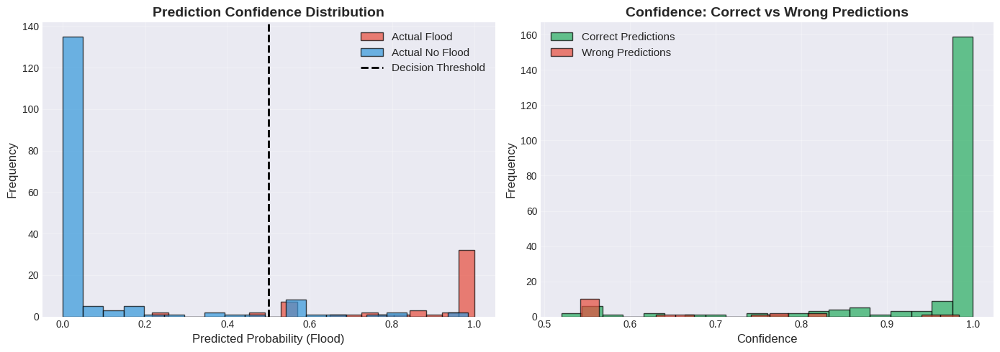

In [25]:
# ==================== CONFIDENCE DISTRIBUTION ====================

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Confidence by class
flood_probs = all_probs[all_targets == 1]
non_flood_probs = all_probs[all_targets == 0]

axes[0].hist(flood_probs, bins=20, alpha=0.7, label='Actual Flood', color='#e74c3c', edgecolor='black')
axes[0].hist(non_flood_probs, bins=20, alpha=0.7, label='Actual No Flood', color='#3498db', edgecolor='black')
axes[0].axvline(x=0.5, color='black', linestyle='--', linewidth=2, label='Decision Threshold')
axes[0].set_xlabel('Predicted Probability (Flood)', fontsize=12)
axes[0].set_ylabel('Frequency', fontsize=12)
axes[0].set_title('Prediction Confidence Distribution', fontsize=14, fontweight='bold')
axes[0].legend(fontsize=11)
axes[0].grid(True, alpha=0.3)

# Confidence by correctness
correct_mask = (all_preds == all_targets)
correct_conf = np.where(all_preds == 1, all_probs, 1 - all_probs)[correct_mask]
wrong_conf = np.where(all_preds == 1, all_probs, 1 - all_probs)[~correct_mask]

if len(correct_conf) > 0:
    axes[1].hist(correct_conf, bins=20, alpha=0.7, label='Correct Predictions', color='#27ae60', edgecolor='black')
if len(wrong_conf) > 0:
    axes[1].hist(wrong_conf, bins=20, alpha=0.7, label='Wrong Predictions', color='#e74c3c', edgecolor='black')
axes[1].set_xlabel('Confidence', fontsize=12)
axes[1].set_ylabel('Frequency', fontsize=12)
axes[1].set_title('Confidence: Correct vs Wrong Predictions', fontsize=14, fontweight='bold')
axes[1].legend(fontsize=11)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('confidence_analysis.png', dpi=150, bbox_inches='tight')
plt.show()


## 9. 🎯 Interactive Single Image Prediction

Test the model on any sample from the dataset.


/tmp/ipython-input-3305450150.py:88: UserWarning: Glyph 127754 (\N{WATER WAVE}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/tmp/ipython-input-3305450150.py:88: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/tmp/ipython-input-3305450150.py:88: UserWarning: Glyph 128205 (\N{ROUND PUSHPIN}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128205 (\N{ROUND PUSHPIN}) missing from font(s) Liberation Sans.
  fig.canvas.print_figure(bytes_io, **kw)


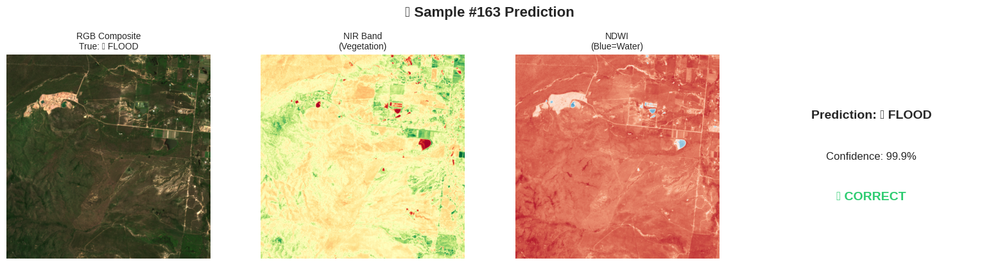


📋 Prediction Details:
   sample_idx: 163
   folder_id: 0331
   filename: S2_2019-02-13
   true_label: Flood
   prediction: Flood
   confidence: 99.9%
   correct: True


In [26]:
def predict_single_sample(sample_idx=None):
    """
    Make a prediction on a single sample and visualize the result.

    Args:
        sample_idx: Index in test dataset. If None, selects random sample.
    """
    if sample_idx is None:
        sample_idx = random.randint(0, len(test_dataset) - 1)

    # Get sample
    sample = test_dataset[sample_idx]
    image = sample['image'].unsqueeze(0).to(device)
    true_label = sample['label'].item()
    folder_id = sample['folder_id']
    filename = sample['filename']

    # Predict
    model.eval()
    with torch.no_grad():
        output = model(image)
        prob = torch.sigmoid(output).item()
        pred_label = 1.0 if prob > 0.5 else 0.0

    confidence = prob if pred_label == 1 else 1 - prob

    # Visualize
    data = load_and_visualize_sample(folder_id, filename, true_label, pred_label, confidence)
    fig = plot_prediction_grid([data], f"📍 Sample #{sample_idx} Prediction")
    plt.show()

    return {
        'sample_idx': sample_idx,
        'folder_id': folder_id,
        'filename': filename,
        'true_label': 'Flood' if true_label == 1 else 'No Flood',
        'prediction': 'Flood' if pred_label == 1 else 'No Flood',
        'confidence': f'{confidence*100:.1f}%',
        'correct': true_label == pred_label
    }

# Test on a random sample
result = predict_single_sample()
print("\n📋 Prediction Details:")
for k, v in result.items():
    print(f"   {k}: {v}")



🔍 Running 10 Random Predictions



/tmp/ipython-input-3305450150.py:88: UserWarning: Glyph 127964 (\N{DESERT}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/tmp/ipython-input-3305450150.py:88: UserWarning: Glyph 65039 (\N{VARIATION SELECTOR-16}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/tmp/ipython-input-3305450150.py:88: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) Liberation Sans.
  plt.tight_layout()
/tmp/ipython-input-3305450150.py:88: UserWarning: Glyph 128205 (\N{ROUND PUSHPIN}) missing from font(s) Liberation Sans.
  plt.tight_layout()


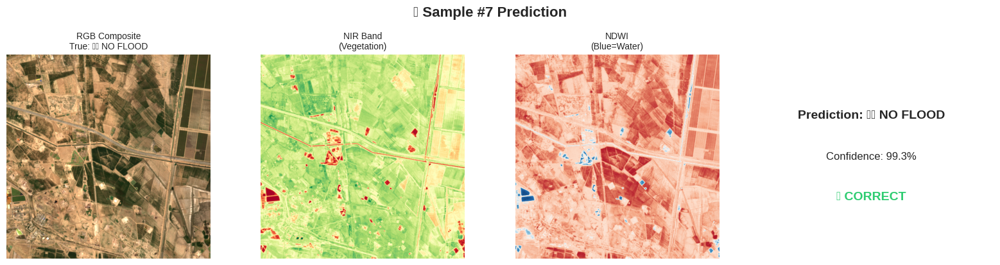


----------------------------------------


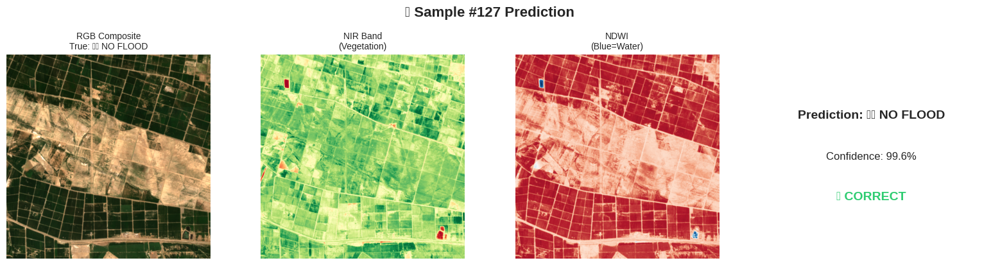


----------------------------------------


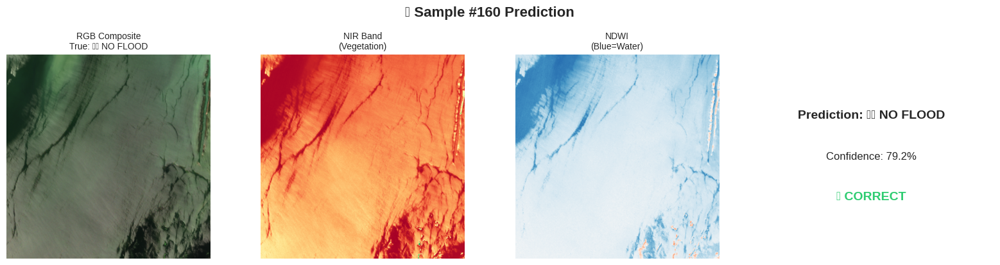


----------------------------------------


/tmp/ipython-input-3305450150.py:88: UserWarning: Glyph 127754 (\N{WATER WAVE}) missing from font(s) Liberation Sans.
  plt.tight_layout()


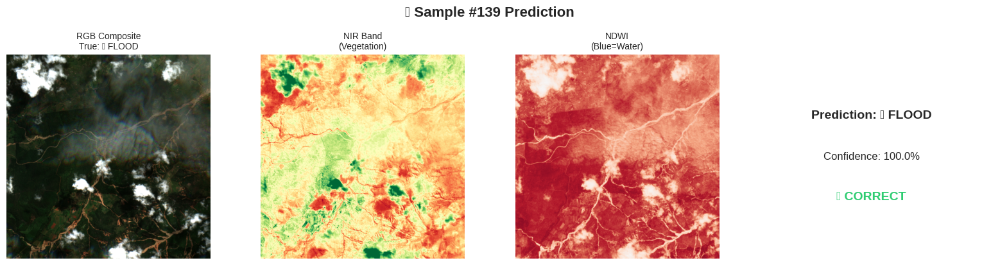


----------------------------------------


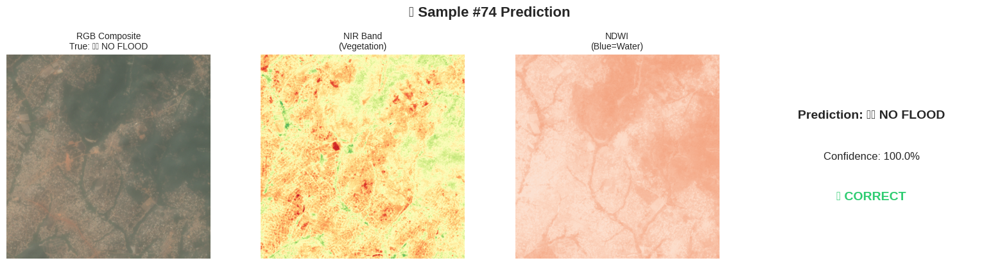


----------------------------------------


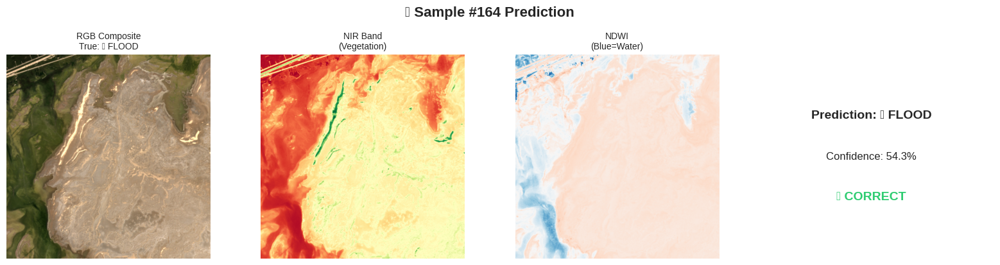


----------------------------------------


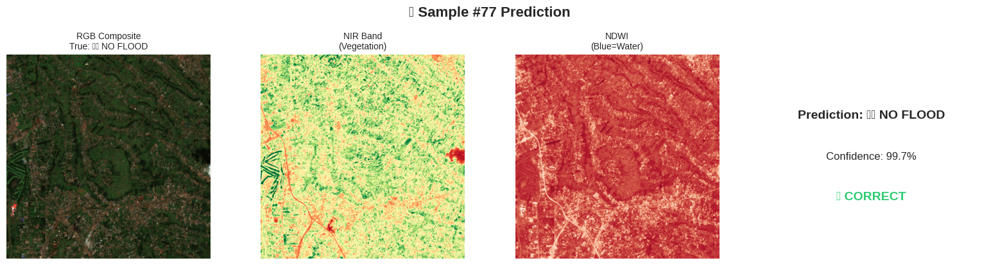


----------------------------------------


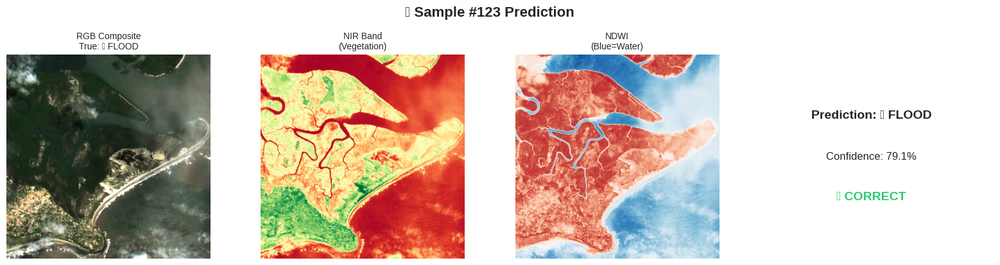


----------------------------------------


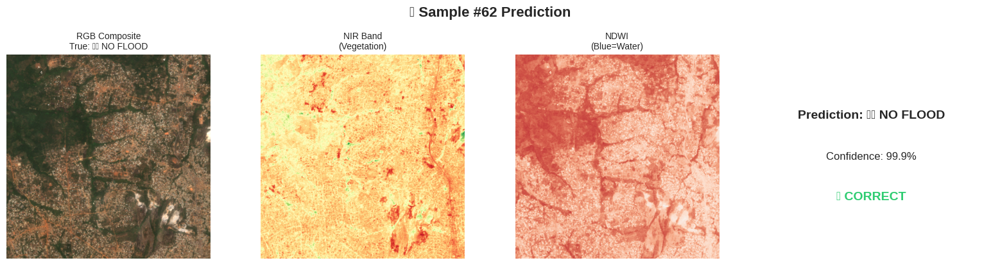


----------------------------------------


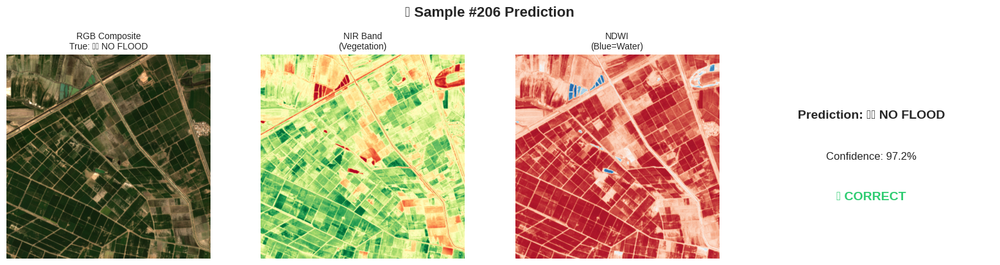


----------------------------------------

📊 Summary: 10/10 correct (100.0%)


In [27]:
# ==================== RUN MULTIPLE PREDICTIONS ====================
# Change the number to see more/fewer predictions

N_PREDICTIONS = 10

print(f"\n{'='*60}")
print(f"🔍 Running {N_PREDICTIONS} Random Predictions")
print(f"{'='*60}\n")

results = []
for i in range(N_PREDICTIONS):
    result = predict_single_sample()
    results.append(result)
    print(f"\n" + "-"*40)

# Summary
correct_count = sum(1 for r in results if r['correct'])
print(f"\n{'='*60}")
print(f"📊 Summary: {correct_count}/{N_PREDICTIONS} correct ({correct_count/N_PREDICTIONS*100:.1f}%)")
print(f"{'='*60}")


## 10. Save Model to Google Drive (Optional)

Mount Google Drive to save your trained model for later use.


In [ ]:
# Uncomment and run to save to Google Drive

# from google.colab import drive
# drive.mount('/content/drive')

# # Save model
# save_path = '/content/drive/MyDrive/FloodNet/floodnet_final.pth'
# os.makedirs(os.path.dirname(save_path), exist_ok=True)
# torch.save(model.state_dict(), save_path)
# print(f"✅ Model saved to: {save_path}")


In [28]:
# ==================== LOAD A SAVED MODEL ====================

def load_model(model_path):
    """
    Load a trained model from file.
    """
    loaded_model = FloodNet(input_channels=4, num_classes=1, pretrained=False).to(device)
    loaded_model.load_state_dict(torch.load(model_path, map_location=device))
    loaded_model.eval()
    print(f"✅ Model loaded from: {model_path}")
    return loaded_model

# Example: Load from current directory
# model = load_model('floodnet_final.pth')

# Example: Load from Google Drive
# model = load_model('/content/drive/MyDrive/FloodNet/floodnet_final.pth')


---

## 🎉 Complete!

You have successfully:
1. ✅ Loaded the SEN12FLOOD dataset
2. ✅ Explored the data with visualizations
3. ✅ Trained a ResNet18-based flood detection model
4. ✅ Evaluated with comprehensive metrics
5. ✅ Visualized and verified predictions

### Next Steps:
- Experiment with different hyperparameters
- Try data augmentation techniques
- Use the model for real-world flood monitoring

---
